In [5]:
import os
from typing import Dict, List, Tuple, Union

import numpy as np

from pyddeeg.signal_processing.rqa_toolbox.rqe import compute_rqa_time_series, compute_rqe_and_correlation, compute_rqa_metrics_for_window

import matplotlib.pyplot as plt
import scienceplots

plt.style.use(['science', 'ieee'])

plt.rcParams['figure.dpi'] = 300

ROOT_PROCESSED = "/home/mariopasc/Python/Datasets/EEG/timeseries/processed/zerolag"
data_ct = np.load(os.path.join(ROOT_PROCESSED, "CT_UP_preprocess_2.npz"))["data"]
data_dd = np.load(os.path.join(ROOT_PROCESSED, "DD_UP_preprocess_2.npz"))["data"]
data_ct_down = np.load(os.path.join(ROOT_PROCESSED, "CT_DOWN_preprocess_2.npz"))["data"]
data_dd_down = np.load(os.path.join(ROOT_PROCESSED, "DD_DOWN_preprocess_2.npz"))["data"]

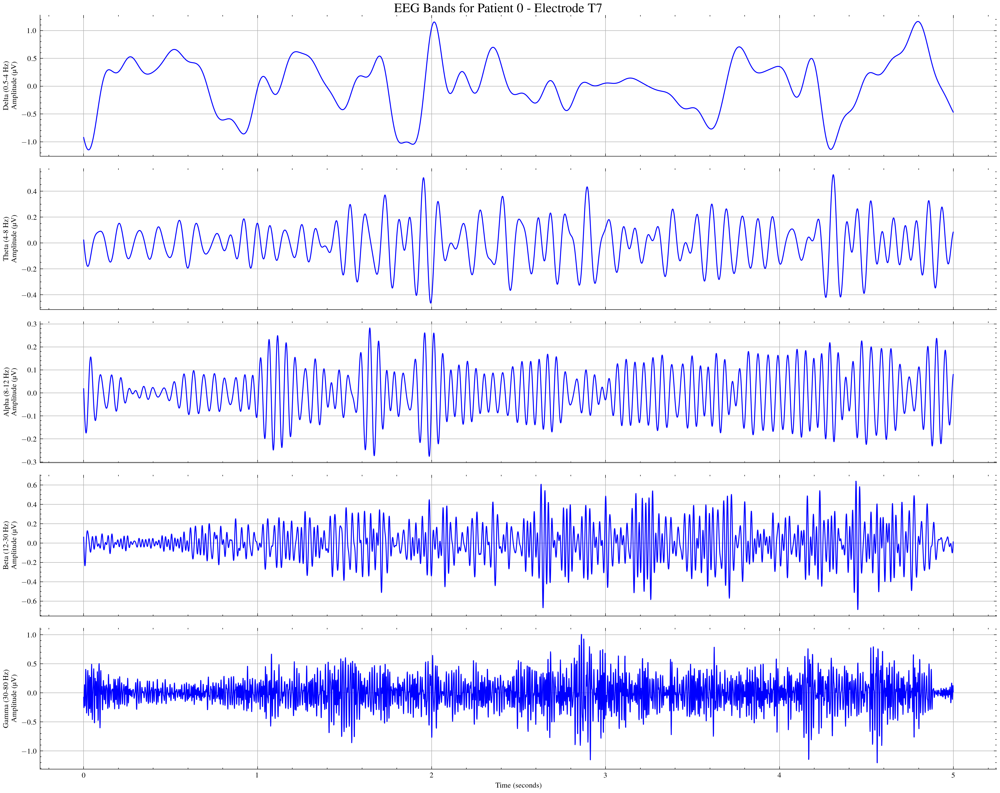

In [4]:
def plot_eeg_bands(data, patient_idx, channel_name, start_time=0, window_size=5000):
    """
    Visualize the 5 EEG bands for a specific patient and electrode.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize (e.g., "Fp1", "Cz", etc.)
    start_time : int
        Starting time point for visualization
    window_size : int
        Number of samples to visualize
    """
    
    # EEG bands names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    # Channel names
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    # Create time vector
    time = np.arange(start_time, start_time + window_size) / 1000  # Convert to seconds
    
    # Extract data for the specified patient, electrode and time window
    data_to_plot = data[patient_idx, electrode_idx, 
                       start_time:start_time + window_size, :]
    
    # Create figure
    fig, axes = plt.subplots(5, 1, figsize=(15, 12), sharex=True)
    fig.suptitle(f'EEG Bands for Patient {patient_idx} - Electrode {channel_name}', 
                 fontsize=14)
    
    # Plot each band
    for i in range(5):
        axes[i].plot(time, data_to_plot[:, i], 'b-', linewidth=1)
        axes[i].set_ylabel(f'{bands[i]}\nAmplitude (µV)')
        axes[i].grid(True)
        
        # Add band-specific styling
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
    
    # Add common x-label
    axes[-1].set_xlabel('Time (seconds)')
    
    # Adjust layout
    plt.tight_layout()
    
    return fig

# Example usage:
# For dyslexic group (dd)
fig = plot_eeg_bands(data_dd, patient_idx=0, channel_name="T7")

*RQA matrix for each bandwidth*

Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...


/tmp/ipykernel_20108/1202132824.py:174: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


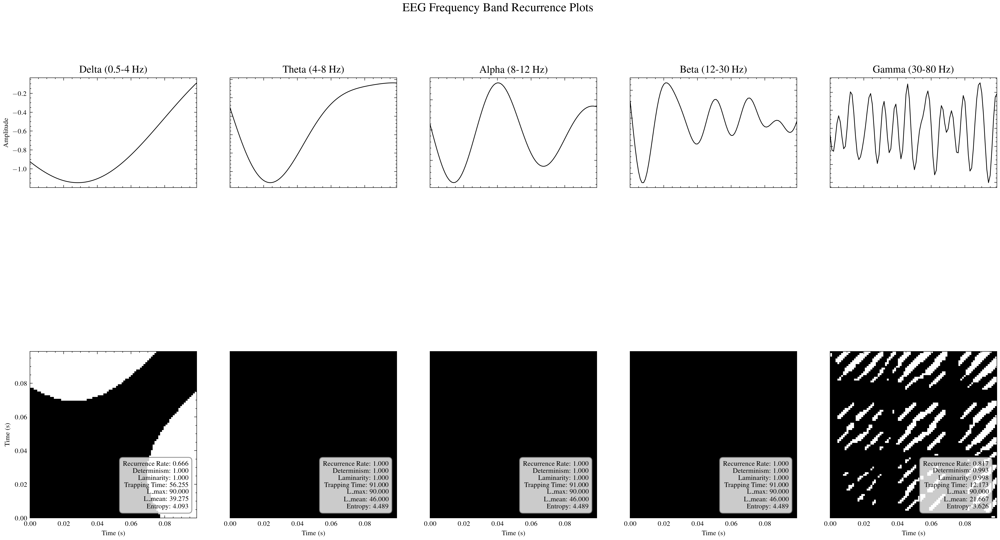

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from typing import Dict, List, Tuple, Union, Optional
from pyunicorn.timeseries import RecurrencePlot

def plot_multiband_rqa(
    band_data: np.ndarray,
    time_range: Tuple[int, int],
    sample_rate: float = 1000.0,
    dim: int = 10,
    tau: int = 1,
    threshold: float = 0.5,
    metric: str = "euclidean",
    show: bool = True,
    save_path: Optional[Union[str, os.PathLike]] = None,
    save_format: str = "svg",
    band_labels: List[str] = None,
) -> List[Dict[str, float]]:
    """
    Generate and visualize Recurrence Plots for multiple EEG frequency bands.
    
    Parameters
    ----------
    band_data : np.ndarray
        Array of shape (n_bands, n_samples) containing the signal for each frequency band
    time_range : Tuple[int, int]
        Tuple indicating (start_idx, end_idx) for the data to analyze
    sample_rate : float, optional
        Sampling rate of the data in Hz, used for time axis labels. Default is 1000.0 Hz.
    dim : int, optional
        Embedding dimension for phase space reconstruction. Default is 10.
    tau : int, optional
        Time delay for phase space reconstruction. Default is 1.
    threshold : float, optional
        Distance threshold for determining recurrence. Default is 0.5.
    metric : str, optional
        Distance metric to use (e.g. 'euclidean'). Default is 'euclidean'.
    show : bool, optional
        If True, displays the plot. If False, the plot is not shown. Default is True.
    save_path : str or os.PathLike, optional
        If provided, the path where the figure is saved. Default is None (no saving).
    save_format : str, optional
        The format to use when saving (e.g., 'svg', 'png'). Default is 'svg'.
    band_labels : List[str], optional
        Labels for each frequency band. If None, uses default band names.
        
    Returns
    -------
    List[Dict[str, float]]
        A list of dictionaries containing RQA metrics for each band
    """
    start_idx, end_idx = time_range
    n_bands = band_data.shape[0]
    
    # Default band labels if none provided
    if band_labels is None:
        band_labels = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
    
    # Create time array in seconds
    time = np.arange(start_idx, end_idx) / sample_rate
    
    # Set up the figure with GridSpec
    fig = plt.figure(figsize=(4 * n_bands, 12))
    
    # Create a GridSpec with 2 rows and n_bands columns
    # Top row will be the time series signals
    # Bottom row will be the recurrence plots
    gs = plt.GridSpec(2, n_bands, height_ratios=[1, 4], hspace=0.1, wspace=0.2)
    
    # Lists to store RecurrencePlot objects and metrics
    rp_objects = []
    all_metrics = []
    
    # Scale for color normalization across all plots
    vmin, vmax = 0, 1
    
    # First pass - compute all recurrence matrices and determine metrics
    for i in range(n_bands):
        # Get data for this band
        data_segment = band_data[i, start_idx:end_idx]
        
        # Create RecurrencePlot object
        if metric.lower() == "meandist":
            from scipy.spatial.distance import pdist
            distances = pdist(data_segment.reshape(-1, 1), metric="euclidean")
            mean_dist = np.mean(distances)
            normalized_threshold = threshold / mean_dist
            actual_threshold = normalized_threshold
            actual_metric = "euclidean"
        else:
            actual_threshold = threshold
            actual_metric = metric
            
        rp = RecurrencePlot(
            data_segment, 
            dim=dim, 
            tau=tau, 
            threshold=actual_threshold, 
            metric=actual_metric, 
            normalize=False
        )
        rp_objects.append(rp)
        
        # Compute metrics
        metrics = {
            "Recurrence Rate": rp.recurrence_rate(),
            "Determinism": rp.determinism(l_min=2),
            "Laminarity": rp.laminarity(v_min=2),
            "Trapping Time": rp.trapping_time(v_min=2),
            "L_max": rp.max_diaglength(),
            "L_mean": rp.average_diaglength(l_min=2),
            "Entropy": rp.diag_entropy(l_min=2),
        }
        all_metrics.append(metrics)
    
    # Second pass - create the plots
    for i in range(n_bands):
        rp = rp_objects[i]
        data_segment = band_data[i, start_idx:end_idx]
        rec_matrix = rp.recurrence_matrix()
        
        # Time series in top row
        ax_top = fig.add_subplot(gs[0, i])
        ax_top.plot(time, data_segment, 'k-', linewidth=0.8)
        ax_top.set_title(f"{band_labels[i]}", fontsize=12)
        ax_top.set_xlim(time[0], time[-1])
        
        # Turn off x ticks for top plots except the first one
        if i > 0:
            ax_top.set_yticklabels([])
        else:
            ax_top.set_ylabel("Amplitude")
            
        # Hide x ticks for top row
        ax_top.set_xticklabels([])
        
        # Recurrence plot in bottom row
        ax_rp = fig.add_subplot(gs[1, i])
        im = ax_rp.imshow(
            rec_matrix,
            cmap="binary",
            origin="lower",
            extent=[time[0], time[-1], time[0], time[-1]],
            vmin=vmin,
            vmax=vmax,
        )
        
        # Label only the leftmost recurrence plot
        if i == 0:
            ax_rp.set_ylabel("Time (s)")
        else:
            ax_rp.set_yticklabels([])
        
        ax_rp.set_xlabel("Time (s)")
        
        # Add metrics as text in the bottom right corner
        metrics_text = "\n".join([
            f"{k}: {v:.3f}" for k, v in all_metrics[i].items()
        ])
        bbox_props = dict(boxstyle="round,pad=0.5", fc="white", ec="gray", alpha=0.8)
        ax_rp.text(
            0.95, 0.05, 
            metrics_text, 
            transform=ax_rp.transAxes, 
            fontsize=8, 
            verticalalignment='bottom', 
            horizontalalignment='right',
            bbox=bbox_props
        )
    
    
    plt.suptitle("EEG Frequency Band Recurrence Plots", fontsize=14)
    plt.tight_layout()
    # Save if a path is provided
    if save_path:
        full_path = f"{save_path}.{save_format}" if "." not in save_path else save_path
        plt.savefig(full_path, format=save_format, bbox_inches="tight", dpi=300)
    
    # Show if requested
    if show:
        plt.show()
    else:
        plt.close(fig)
    
    return all_metrics

# Example usage:
def display_band_rqa(
    data: np.ndarray, 
    patient_idx: int, 
    channel_name: str, 
    time_range: Tuple[int, int],
    save_path: str = None
) -> List[Dict[str, float]]:
    """
    Display RQA plots for all frequency bands of a specific patient and channel.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize
    time_range : Tuple[int, int]
        Range of samples to visualize (start_idx, end_idx)
        
    Returns:
    --------
    List[Dict[str, float]]
        RQA metrics for each frequency band
    """
    # Channel names list
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    band_labels = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
                  'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    start_idx, end_idx = time_range
    
    # Extract data and reshape to (n_bands, n_samples)
    band_data = data[patient_idx, electrode_idx, start_idx:end_idx, :].T
    
    # Call the multiband RQA plotting function
    metrics = plot_multiband_rqa(
        band_data=band_data,
        time_range=(0, end_idx - start_idx),  # Relative to extracted segment
        sample_rate=1000.0,
        dim=10,
        tau=1,
        threshold=0.5,
        metric="meandist",
        band_labels=band_labels,
        save_format="svg",
        save_path=save_path
    )
    
    return metrics

# Example call:
metrics = display_band_rqa(data_dd, patient_idx=0, channel_name="T7", time_range=(000, 100), save_path="./rqe/results/ct_t7_rqa.svg")

/tmp/ipykernel_20108/116929390.py:220: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


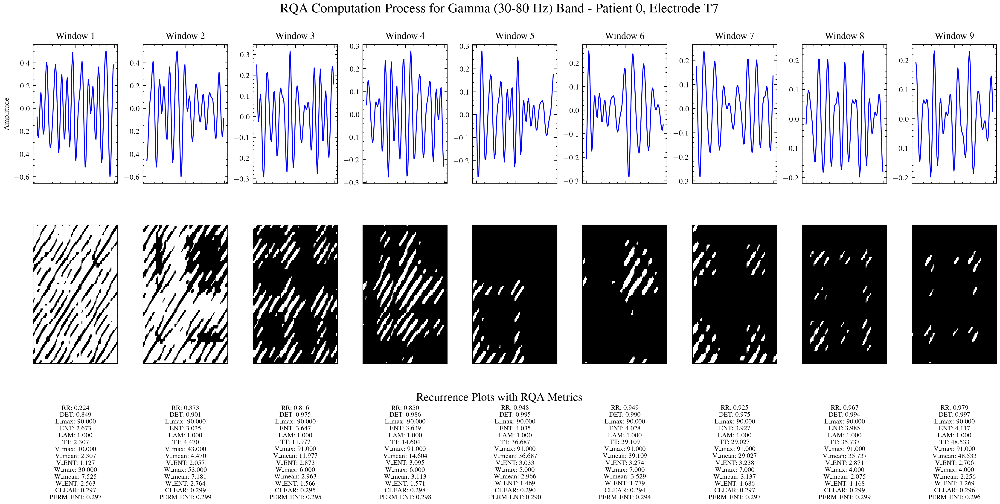

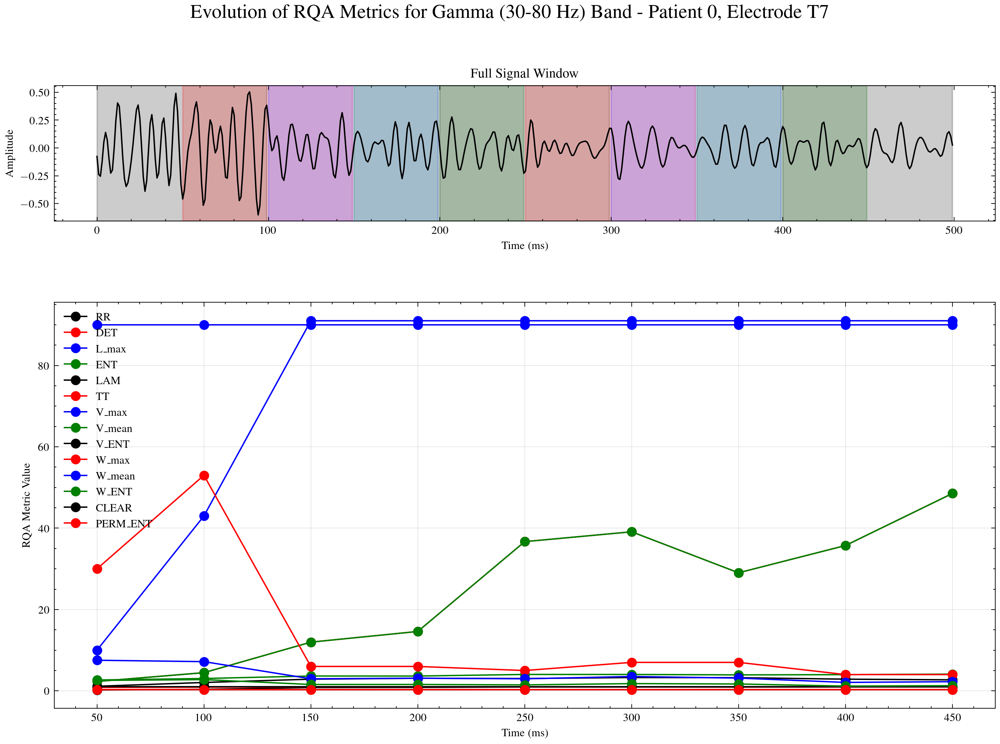

In [6]:
def visualize_rqe_process(
    data: np.ndarray,
    patient_idx: int,
    channel_name: str,
    band_idx: int = 4,  # Default to Gamma band
    start_time: int = 0,
    window_size: int = 110,
    raw_signal_window_size: int = 50,
    embedding_dim: int = 10,
    time_delay: int = 1,
    radius: float = 70.0,
    distance_metric: str = "meandist",
    min_diagonal_line: int = 5,
    min_vertical_line: int = 1,
    min_white_vertical_line: int = 1,
    metrics_to_use: List[str] = ["RR", "DET", "L_max", "ENT", "LAM", "TT"],
    stride: int = 1,
) -> Tuple[plt.Figure, plt.Figure]:
    """
    Visualize the RQE computation process for a single frequency band.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize
    band_idx : int
        Index of the frequency band to visualize (0=Delta, 1=Theta, 2=Alpha, 3=Beta, 4=Gamma)
    start_time : int
        Starting time point for visualization
    window_size : int
        Number of samples to visualize
    raw_signal_window_size : int
        Size of sliding window for computing RQA metrics
    embedding_dim, time_delay, radius, etc. : Various RQA parameters
        Parameters for RQA computation
        
    Returns:
    --------
    fig1, fig2 : matplotlib.figure.Figure
        Figure objects for the two plots
    """
    from pyunicorn.timeseries import RecurrencePlot
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy import stats
    
    # EEG bands names and channel names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    # Extract data for the specified patient, electrode, band and time window
    signal = data[patient_idx, electrode_idx, start_time:start_time+window_size, band_idx]
    
    # Calculate how many sliding windows we'll have
    num_windows = (window_size - raw_signal_window_size) // stride + 1
    
    # Create time vector (in milliseconds)
    time = np.arange(start_time, start_time + window_size) 
    
    # Compute the sliding windows and their recurrence plots
    windows = []
    rqa_metrics = []
    rec_matrices = []  # Store the actual matrices
    

    for i in range(num_windows):
        start_idx = i * stride
        end_idx = start_idx + raw_signal_window_size
        # print(f"Window {i}: {start_idx} - {end_idx}")
        window_signal = signal[start_idx:end_idx]
        windows.append(window_signal)
        
        # Calculate RQA metrics for this window
        metrics = compute_rqa_metrics_for_window(
            window_signal=window_signal,
            embedding_dim=embedding_dim,
            time_delay=time_delay,
            radius=radius,
            distance_metric=distance_metric,
            min_diagonal_line=min_diagonal_line,
            min_vertical_line=min_vertical_line,
            min_white_vertical_line=min_white_vertical_line,
            metrics_to_use=metrics_to_use
        )
        rqa_metrics.append(metrics)
        
        # Compute and store the recurrence matrix
        if distance_metric.lower() == "meandist":
            from scipy.spatial.distance import pdist
            distances = pdist(window_signal.reshape(-1, 1), metric="euclidean")
            mean_dist = np.mean(distances) if len(distances) > 0 else 1.0
            normalized_radius = radius / mean_dist
            actual_radius = normalized_radius
            actual_metric = "euclidean"
        else:
            actual_radius = radius
            actual_metric = distance_metric
        
        # print(actual_radius, actual_metric)
        try:
            rp = RecurrencePlot(
                time_series=window_signal,
                dim=embedding_dim,
                tau=time_delay,
                metric=actual_metric,
                threshold=actual_radius,
                silence_level=2,
            )
            # Get the matrix and store it
            rec_matrix = rp.recurrence_matrix()

            rec_matrices.append(rec_matrix)
        except Exception as e:
            print(f"Error computing recurrence plot for window {i}: {e}")
            # Create a dummy matrix of zeros
            rec_matrices.append(np.zeros((raw_signal_window_size, raw_signal_window_size)))
    
    # PLOT 1: Sliding windows and their recurrence plots
    # Create a figure with n_windows columns and 2 rows
    n_cols = min(10, num_windows)  # Limit to 10 columns max
    n_rows = 2
    
    fig1 = plt.figure(figsize=(n_cols*2, 6))
    fig1.suptitle(f"RQA Computation Process for {bands[band_idx]} Band - Patient {patient_idx}, Electrode {channel_name}", 
                 fontsize=14)
    
    gs = fig1.add_gridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # Plot up to the first 10 windows
    for i in range(min(n_cols, num_windows)):
        # Signal window plot
        ax_signal = fig1.add_subplot(gs[0, i])
        window_start = i * stride
        window_end = window_start + raw_signal_window_size
        window_time = time[window_start:window_end]
        
        ax_signal.plot(window_time, windows[i], 'b-')
        ax_signal.set_title(f"Window {i+1}", fontsize=10)
        if i == 0:
            ax_signal.set_ylabel("Amplitude")
        ax_signal.set_xticklabels([])
        
        # Recurrence plot
        ax_rp = fig1.add_subplot(gs[1, i])
        
        # Directly use the stored matrix
        #print(f"Matrix {i} shape: {rec_matrices[-1].shape}, non-zero elements: {np.count_nonzero(rec_matrices[-1])}")

        im = ax_rp.imshow(rec_matrices[i], cmap='binary', origin='lower', aspect='auto', interpolation='none')
        ax_rp.set_xticks([])
        ax_rp.set_yticks([])
        
        # Add metrics as text
        metrics = rqa_metrics[i]
        metrics_text = "\n".join([f"{k}: {metrics[k]:.3f}" if metrics[k] is not None else f"{k}: None" 
                                  for k in metrics_to_use])
        ax_rp.text(0.5, -0.3, metrics_text, transform=ax_rp.transAxes, 
                   fontsize=7, ha='center', va='top')
    
    # Add common xlabel for bottom row
    fig1.text(0.5, 0.02, "Recurrence Plots with RQA Metrics", ha='center', fontsize=12)
    
    # PLOT 2: Evolution of RQA metrics over time
    fig2 = plt.figure(figsize=(12, 8))
    fig2.suptitle(f"Evolution of RQA Metrics for {bands[band_idx]} Band - Patient {patient_idx}, Electrode {channel_name}", 
                 fontsize=14)
    
    gs = fig2.add_gridspec(2, 1, height_ratios=[1, 3], hspace=0.3)
    
    # Original signal
    ax_full_signal = fig2.add_subplot(gs[0])
    ax_full_signal.plot(time, signal, 'k-')
    ax_full_signal.set_title("Full Signal Window")
    ax_full_signal.set_xlabel("Time (ms)")
    ax_full_signal.set_ylabel("Amplitude")
    
    # Highlight each window
    for i in range(min(n_cols, num_windows)):
        window_start = i * stride
        window_end = window_start + raw_signal_window_size - 1
        ax_full_signal.axvspan(time[window_start], time[window_end], 
                              alpha=0.2, color=f'C{i%10}')
    
    # RQA metrics evolution
    ax_metrics = fig2.add_subplot(gs[1])
    
    # Calculate x positions for each window (use the middle of each window)
    window_centers = [time[i*stride + raw_signal_window_size//2] for i in range(num_windows)]
    
    # Plot each metric
    for m_idx, metric in enumerate(metrics_to_use):
        metric_values = [rqa_metrics[i][metric] for i in range(num_windows) 
                        if rqa_metrics[i][metric] is not None]
        window_positions = [window_centers[i] for i in range(num_windows) 
                           if rqa_metrics[i][metric] is not None]
        
        if len(metric_values) > 0:
            ax_metrics.plot(window_positions, metric_values, 'o-', label=metric)
    
    ax_metrics.set_xlabel("Time (ms)")
    ax_metrics.set_ylabel("RQA Metric Value")
    ax_metrics.legend(loc='best')
    ax_metrics.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    return fig1, fig2, rec_matrices

# Example usage:
band_names = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
band_idx = 4  # Gamma band

fig1, fig2, rec = visualize_rqe_process(
    data=data_dd,
    patient_idx=0,
    channel_name="T7",
    band_idx=band_idx,
    start_time=0,
    window_size=500,
    raw_signal_window_size=100,
    embedding_dim=10,
    time_delay=1,
    radius=0.8,
    distance_metric="euclidean",
    min_diagonal_line=5,
    min_vertical_line=1,
    min_white_vertical_line=1,
    metrics_to_use=["RR", "DET", "L_max", "ENT", "LAM", "TT", "V_max", 
                    "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "CLEAR", "PERM_ENT"],
    stride= 50 
)

fig1.savefig(f"./rqe/results/ct_t7_{band_names[band_idx]}_rqa_process.svg", format="svg", bbox_inches="tight", dpi=300)
fig2.savefig(f"./rqe/results/ct_t7_{band_names[band_idx]}_rqa_evolution.svg", format="svg", bbox_inches="tight", dpi=300)

plt.show()

/home/mariopasc/Python/Projects/Dyslexia_EEG_characterization/src/pyddeeg/signal_processing/rqa_toolbox/rqe.py:204: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, _ = stats.spearmanr(sub_block_T[l1, :], sub_block_T[l2, :])
/tmp/ipykernel_83608/2158194804.py:306: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


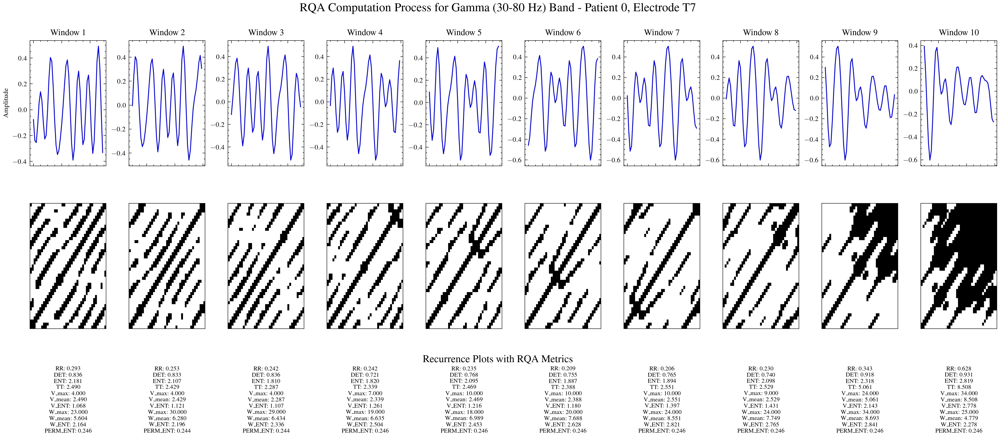

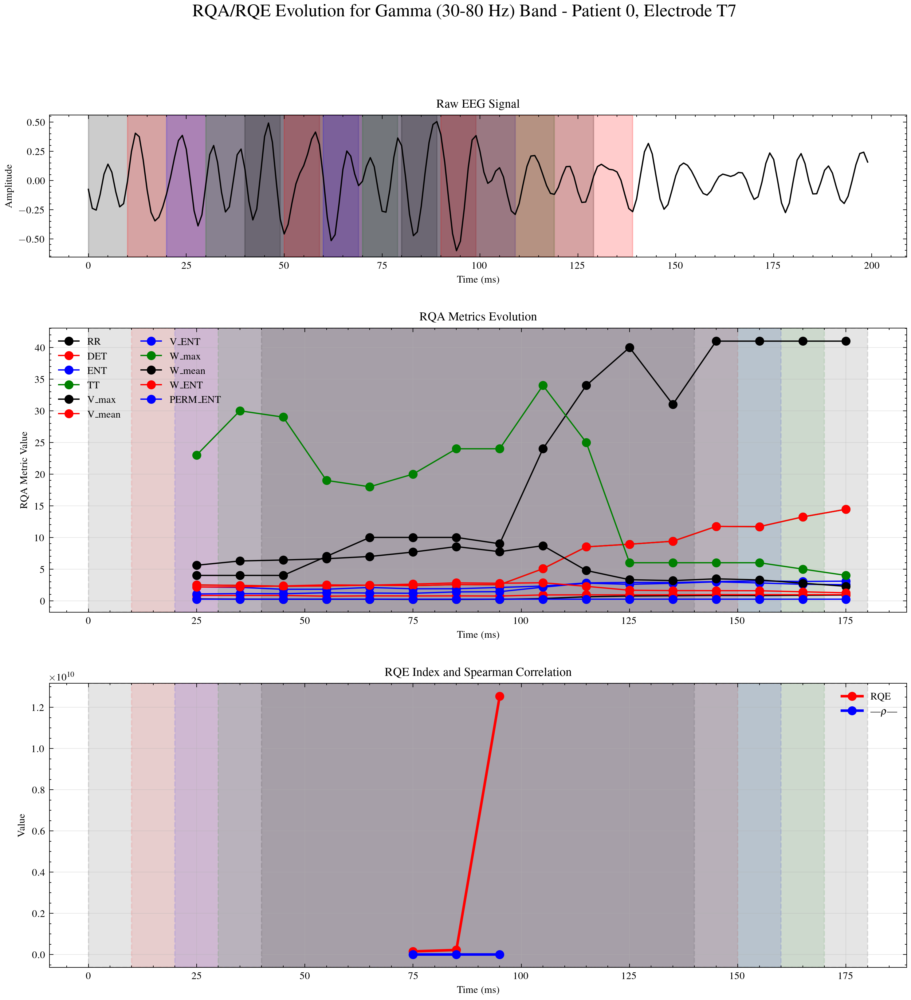

In [6]:
def visualize_rqe_process(
    data: np.ndarray,
    patient_idx: int,
    channel_name: str,
    band_idx: int = 4,  # Default to Gamma band
    start_time: int = 0,
    window_size: int = 500,
    raw_signal_window_size: int = 100,
    rqa_window_size: int = 55,  # Added parameter for RQA window size
    embedding_dim: int = 10,
    time_delay: int = 1,
    radius: float = 0.8,
    distance_metric: str = "euclidean",
    min_diagonal_line: int = 5,
    min_vertical_line: int = 1,
    min_white_vertical_line: int = 1,
    metrics_to_use: List[str] = ["RR", "DET", "L_max", "ENT", "LAM", "TT"],
    stride: int = 1,
    normalize_metrics: bool = True,  # New parameter for normalization
) -> Tuple[plt.Figure, plt.Figure, List[np.ndarray]]:
    """
    Visualize the RQE computation process for a single frequency band.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize
    band_idx : int
        Index of the frequency band to visualize (0=Delta, 1=Theta, 2=Alpha, 3=Beta, 4=Gamma)
    start_time : int
        Starting time point for visualization
    window_size : int
        Number of samples to visualize
    raw_signal_window_size : int
        Size of sliding window for computing RQA metrics
    rqa_window_size : int
        Size of window for computing RQE correlation in the RQA space
    embedding_dim, time_delay, radius, etc. : Various RQA parameters
        Parameters for RQA computation
    normalize_metrics : bool
        Whether to normalize metrics to [0,1] range before computing correlation
        
    Returns:
    --------
    fig1, fig2, rec_matrices : Tuple[plt.Figure, plt.Figure, List[np.ndarray]]
        Figure objects for the two plots and list of recurrence matrices
    """
    from pyunicorn.timeseries import RecurrencePlot
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy import stats
    from pyddeeg.signal_processing.rqa_toolbox.rqe import compute_rqe_and_correlation
    
    # EEG bands names and channel names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    # Extract data for the specified patient, electrode, band and time window
    signal = data[patient_idx, electrode_idx, start_time:start_time+window_size, band_idx]
    
    # Calculate how many sliding windows we'll have
    num_windows = (window_size - raw_signal_window_size) // stride + 1
    
    # Create time vector (in milliseconds)
    time = np.arange(start_time, start_time + window_size) 
    
    # Compute the sliding windows and their recurrence plots
    windows = []
    rqa_metrics = []
    rec_matrices = []  # Store the actual matrices
    
    for i in range(num_windows):
        start_idx = i * stride
        end_idx = start_idx + raw_signal_window_size
        window_signal = signal[start_idx:end_idx]
        windows.append(window_signal)
        
        # Calculate RQA metrics for this window
        metrics = compute_rqa_metrics_for_window(
            window_signal=window_signal,
            embedding_dim=embedding_dim,
            time_delay=time_delay,
            radius=radius,
            distance_metric=distance_metric,
            min_diagonal_line=min_diagonal_line,
            min_vertical_line=min_vertical_line,
            min_white_vertical_line=min_white_vertical_line,
            metrics_to_use=metrics_to_use
        )
        rqa_metrics.append(metrics)
        
        # Compute and store the recurrence matrix
        if distance_metric.lower() == "meandist":
            from scipy.spatial.distance import pdist
            distances = pdist(window_signal.reshape(-1, 1), metric="euclidean")
            mean_dist = np.mean(distances) if len(distances) > 0 else 1.0
            normalized_radius = radius / mean_dist
            actual_radius = normalized_radius
            actual_metric = "euclidean"
        else:
            actual_radius = radius
            actual_metric = distance_metric
        
        try:
            rp = RecurrencePlot(
                time_series=window_signal,
                dim=embedding_dim,
                tau=time_delay,
                metric=actual_metric,
                threshold=actual_radius,
                silence_level=2,
            )
            # Get the matrix and store it
            rec_matrix = rp.recurrence_matrix()
            rec_matrices.append(rec_matrix)
        except Exception as e:
            print(f"Error computing recurrence plot for window {i}: {e}")
            # Create a dummy matrix of zeros
            rec_matrices.append(np.zeros((raw_signal_window_size, raw_signal_window_size)))
    
    # Convert RQA metrics to a numpy array for easier manipulation
    rqa_array = np.zeros((num_windows, len(metrics_to_use)))
    for i in range(num_windows):
        for j, metric in enumerate(metrics_to_use):
            val = rqa_metrics[i][metric]
            if val is not None:
                rqa_array[i, j] = val
            else:
                rqa_array[i, j] = np.nan
    
    # Store the original metrics for plotting
    rqa_array_original = rqa_array.copy()
    
    # Normalize each metric to [0,1] range if requested
    if normalize_metrics:
        # Normalize each column (metric) independently
        for j in range(rqa_array.shape[1]):
            col = rqa_array[:, j]
            # Skip if all values are NaN
            if np.all(np.isnan(col)):
                continue
                
            # Extract non-NaN values
            valid_values = col[~np.isnan(col)]
            if len(valid_values) > 0:
                col_min = np.min(valid_values)
                col_max = np.max(valid_values)
                
                # Avoid division by zero
                if col_max > col_min:
                    # Normalize non-NaN values
                    col[~np.isnan(col)] = (col[~np.isnan(col)] - col_min) / (col_max - col_min)
                    rqa_array[:, j] = col
                
    # This is the correct way to compute RQE and correlation values
    if num_windows > rqa_window_size:  # Ensure we have enough windows
        rqe_values, corr_values = compute_rqe_and_correlation(rqa_array, rqa_window_size)
    else:
        print(f"Warning: Not enough windows ({num_windows}) for RQA window size ({rqa_window_size})")
        rqe_values = np.zeros(max(1, num_windows - rqa_window_size + 1))
        corr_values = np.zeros(max(1, num_windows - rqa_window_size + 1))
    
    # PLOT 1: Sliding windows and their recurrence plots
    # Create a figure with n_windows columns and 2 rows
    n_cols = min(10, num_windows)  # Limit to 10 columns max
    n_rows = 2
    
    fig1 = plt.figure(figsize=(n_cols*2, 6))
    fig1.suptitle(f"RQA Computation Process for {bands[band_idx]} Band - Patient {patient_idx}, Electrode {channel_name}", 
                 fontsize=14)
    
    gs = fig1.add_gridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # Plot up to the first 10 windows
    for i in range(min(n_cols, num_windows)):
        # Signal window plot
        ax_signal = fig1.add_subplot(gs[0, i])
        window_start = i * stride
        window_end = window_start + raw_signal_window_size
        window_time = time[window_start:window_end]
        
        ax_signal.plot(window_time, windows[i], 'b-')
        ax_signal.set_title(f"Window {i+1}", fontsize=10)
        if i == 0:
            ax_signal.set_ylabel("Amplitude")
        ax_signal.set_xticklabels([])
        
        # Recurrence plot
        ax_rp = fig1.add_subplot(gs[1, i])
        
        # Directly use the stored matrix
        im = ax_rp.imshow(rec_matrices[i], cmap='binary', origin='lower', aspect='auto', interpolation='none')
        ax_rp.set_xticks([])
        ax_rp.set_yticks([])
        
        # Add metrics as text - use original (non-normalized) metrics for display
        metrics = rqa_metrics[i]
        metrics_text = "\n".join([f"{k}: {metrics[k]:.3f}" if metrics[k] is not None else f"{k}: None" 
                                  for k in metrics_to_use])  # Limit to first 6 metrics for readability
        ax_rp.text(0.5, -0.3, metrics_text, transform=ax_rp.transAxes, 
                   fontsize=7, ha='center', va='top')
    
    # Add common xlabel for bottom row
    fig1.text(0.5, 0.02, "Recurrence Plots with RQA Metrics", ha='center', fontsize=12)
    
    # PLOT 2: Evolution of RQA metrics, RQE and correlation
    fig2 = plt.figure(figsize=(12, 12))  # Increased height for three rows
    fig2.suptitle(f"RQA/RQE Evolution for {bands[band_idx]} Band - Patient {patient_idx}, Electrode {channel_name}", 
                 fontsize=14)
    
    if normalize_metrics:
        fig2.text(0.5, 0.01, "Note: RQA metrics were normalized to [0,1] range before RQE computation", 
                 ha='center', fontsize=10, style='italic')
    
    gs = fig2.add_gridspec(3, 1, height_ratios=[1, 2, 2], hspace=0.3)  # Now 3 rows
    
    # Original signal (row 0)
    ax_full_signal = fig2.add_subplot(gs[0])
    ax_full_signal.plot(time, signal, 'k-')
    ax_full_signal.set_title("Raw EEG Signal")
    ax_full_signal.set_xlabel("Time (ms)")
    ax_full_signal.set_ylabel("Amplitude")
    
    # Highlight each window on the time domain
    for i in range(min(n_cols, num_windows)):
        window_start = i * stride
        window_end = window_start + raw_signal_window_size - 1
        ax_full_signal.axvspan(time[window_start], time[window_end], 
                              alpha=0.2, color=f'C{i%10}')
    
    # RQA metrics evolution (row 1) - use original metrics for plotting
    ax_metrics = fig2.add_subplot(gs[1])
    
    # Calculate x positions for each window (use the middle of each window)
    window_centers = [time[i*stride + raw_signal_window_size//2] for i in range(num_windows)]
    
    # Plot each metric using the original (non-normalized) values
    for m_idx, metric in enumerate(metrics_to_use):
        metric_values = [rqa_metrics[i][metric] for i in range(num_windows) 
                        if rqa_metrics[i][metric] is not None]
        window_positions = [window_centers[i] for i in range(num_windows) 
                           if rqa_metrics[i][metric] is not None]
        
        if len(metric_values) > 0:
            ax_metrics.plot(window_positions, metric_values, 'o-', label=metric)
    
    ax_metrics.set_title("RQA Metrics Evolution")
    ax_metrics.set_xlabel("Time (ms)")
    ax_metrics.set_ylabel("RQA Metric Value")
    ax_metrics.legend(loc='best', fontsize=8, ncol=2)  # Smaller font, 2 columns for legend
    ax_metrics.grid(True, alpha=0.3)
    
    # Now add an additional plot for RQE and correlation (row 2)
    ax_rqe = fig2.add_subplot(gs[2])
    
    # Calculate time points for RQE/correlation values (middle of each RQA window)
    if len(rqe_values) > 0:
        # Calculate the time point for each RQE/correlation value
        rqe_time_points = []
        for i in range(len(rqe_values)):
            center_idx = i + rqa_window_size // 2
            if center_idx < len(window_centers):
                rqe_time_points.append(window_centers[center_idx])
            else:
                rqe_time_points.append(window_centers[-1])
        
        # Plot RQE and correlation values
        ax_rqe.plot(rqe_time_points, rqe_values, 'ro-', label='RQE', linewidth=2)
        ax_rqe.plot(rqe_time_points, corr_values, 'bo-', label=r'|$\rho$|', linewidth=2)
        
        # Highlight RQA windows used for each RQE/correlation calculation
        for i in range(min(5, len(rqe_values))):  # Only show first 5 for clarity
            first_window_idx = i
            last_window_idx = i + rqa_window_size - 1
            
            if first_window_idx < len(window_centers) and last_window_idx < len(window_centers):
                window_start = window_centers[first_window_idx] - raw_signal_window_size/2
                window_end = window_centers[last_window_idx] + raw_signal_window_size/2
                
                ax_metrics.axvspan(window_start, window_end, alpha=0.1, color=f'C{i%10}', 
                                  linestyle='--')
                ax_rqe.axvspan(window_start, window_end, alpha=0.1, color=f'C{i%10}',
                              linestyle='--')
    
    ax_rqe.set_title("RQE Index and Spearman Correlation")
    ax_rqe.set_xlabel("Time (ms)")
    ax_rqe.set_ylabel("Value")
    ax_rqe.legend(loc='upper right')
    ax_rqe.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    return fig1, fig2, rec_matrices

# Example usage with normalization:
band_names = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
band_idx = 4  # Gamma band

fig1, fig2, rec = visualize_rqe_process(
    data=data_dd,
    patient_idx=0,
    channel_name="T7",
    band_idx=band_idx,
    start_time=0,
    window_size=200,
    raw_signal_window_size=50,
    rqa_window_size=10, 
    embedding_dim=10,
    time_delay=1,
    radius=0.8,
    distance_metric="euclidean",
    min_diagonal_line=5,
    min_vertical_line=1,
    min_white_vertical_line=1,
    metrics_to_use=["RR", "DET", "ENT", "TT", "V_max", 
                    "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
    stride=10,
    normalize_metrics=False  # Enable normalization
)

fig1.savefig(f"./rqe/results/ct_t7_{band_names[band_idx]}_rqa_process.svg", format="svg", bbox_inches="tight", dpi=300)
fig2.savefig(f"./rqe/results/ct_t7_{band_names[band_idx]}_rqa_evolution.svg", format="svg", bbox_inches="tight", dpi=300)

plt.show()

*RQE metric overlayed over the different bandwidths*

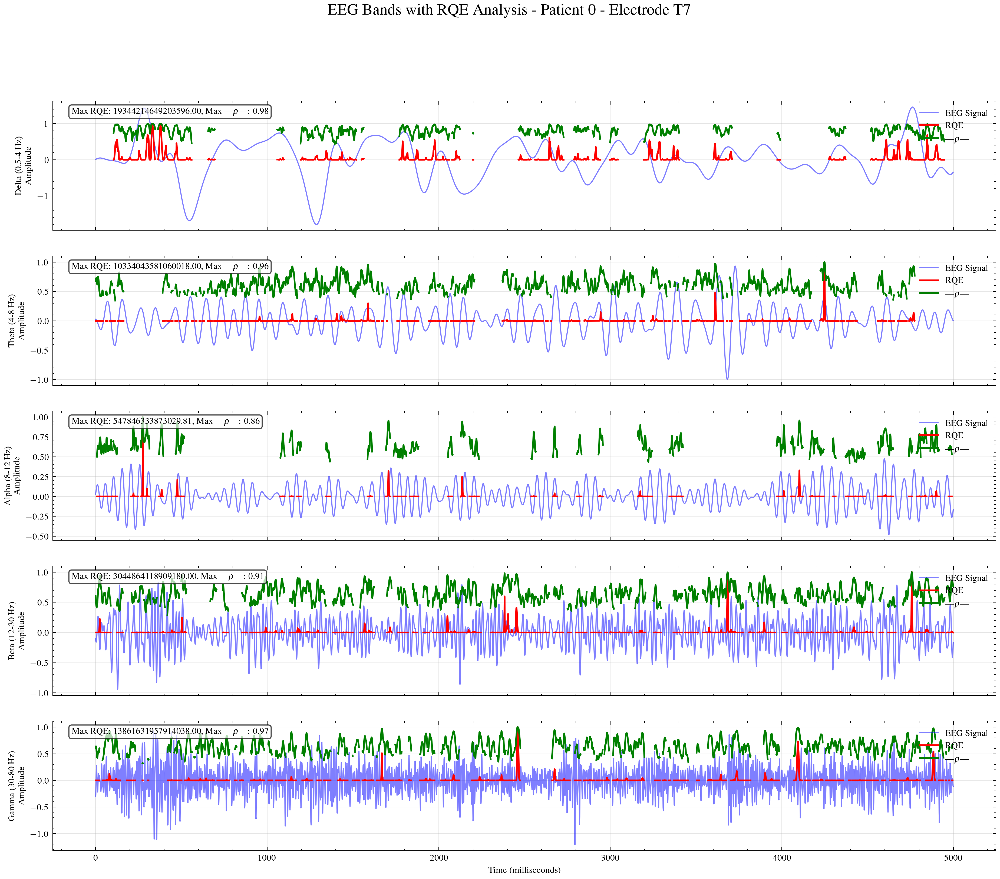

In [18]:
def plot_eeg_bands_with_rqe(
    data: np.ndarray,
    patient_idx: int,
    channel_name: str,
    start_time: int = 0,
    window_size: int = 5000,
    rqe_params: Dict = {
        "embedding_dim": 10,
        "radius": 0.8,
        "time_delay": 1,
        "raw_signal_window_size": 100,
        "rqa_space_window_size": 25,
        "min_diagonal_line": 5,
        "min_vertical_line": 1,
        "min_white_vertical_line": 1,
        "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
        "stride": 1
    },
    normalize_metrics: bool = False,
    debug: bool = True  # Add debug flag to print information
) -> Tuple[plt.Figure, List[plt.Axes]]:
    """
    Visualize EEG bands with RQE analysis overlay for a specific patient and electrode.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize
    start_time : int
        Starting time point for visualization
    window_size : int
        Number of samples to visualize
    rqe_params : Dict
        Parameters for RQE analysis
    normalize_metrics : bool
        Whether to normalize metrics before computing RQE
    debug : bool
        Whether to print debug information
    
    Returns:
    --------
    fig : plt.Figure
        The figure object
    axes : List[plt.Axes]
        List of axes objects
    """
    
    # EEG bands names and channel names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    if debug:
        print(f"Processing data for patient {patient_idx}, electrode {channel_name} ({electrode_idx})")
        print(f"Data shape: {data.shape}")
        print(f"Time window: {start_time} to {start_time + window_size}")
        print(f"RQE parameters: {rqe_params}")
    
    # Create time vector (in milliseconds)
    time = np.arange(start_time, start_time + window_size)  
    
    # Extract data
    data_to_plot = data[patient_idx, electrode_idx, start_time:start_time + window_size, :]
    
    if debug:
        print(f"Extracted data shape: {data_to_plot.shape}")
    
    # Create figure
    fig, axes = plt.subplots(5, 1, figsize=(15, 12), sharex=True)
    fig.suptitle(f'EEG Bands with RQE Analysis - Patient {patient_idx} - Electrode {channel_name}', 
                 fontsize=14)
    
    # Plot each band with RQE overlay
    for i in range(5):
        if debug:
            print(f"\nProcessing band {i}: {bands[i]}")
        
        # Original signal with alpha=0.5
        axes[i].plot(time, data_to_plot[:, i], 'b-', linewidth=1, alpha=0.5, label='EEG Signal')
        
        # Compute RQE for this band
        band_signal = data_to_plot[:, i]
        
        if debug:
            print(f"Band signal shape: {band_signal.shape}")
            print(f"Band signal min: {np.min(band_signal)}, max: {np.max(band_signal)}, mean: {np.mean(band_signal)}")
            print(f"Computing RQA time series...")
        
        try:
            # Compute RQA time series
            rqa_matrix = compute_rqa_time_series(
                signal=band_signal,
                raw_signal_window_size=rqe_params["raw_signal_window_size"],
                embedding_dim=rqe_params["embedding_dim"],
                time_delay=rqe_params["time_delay"],
                radius=rqe_params["radius"],
                distance_metric="euclidean",
                min_diagonal_line=rqe_params["min_diagonal_line"],
                min_vertical_line=rqe_params["min_vertical_line"],
                min_white_vertical_line=rqe_params["min_white_vertical_line"],
                metrics_to_use=rqe_params["metrics_to_use"],
                stride=rqe_params["stride"]
            )
            
            if debug:
                print(f"RQA matrix shape: {rqa_matrix.shape}")
                print(f"RQA matrix contains NaN: {np.isnan(rqa_matrix).any()}")
                print(f"RQA matrix non-NaN values: {np.count_nonzero(~np.isnan(rqa_matrix))}")
            
            # If we should normalize the metrics
            if normalize_metrics:
                # Normalize each column (metric) independently
                for j in range(rqa_matrix.shape[1]):
                    col = rqa_matrix[:, j]
                    # Skip if all values are NaN
                    if np.all(np.isnan(col)):
                        continue
                        
                    # Extract non-NaN values
                    valid_values = col[~np.isnan(col)]
                    if len(valid_values) > 0:
                        col_min = np.min(valid_values)
                        col_max = np.max(valid_values)
                        
                        # Avoid division by zero
                        if col_max > col_min:
                            # Normalize non-NaN values
                            col[~np.isnan(col)] = (col[~np.isnan(col)] - col_min) / (col_max - col_min)
                            rqa_matrix[:, j] = col
            
            # Check if there are enough windows for RQE computation
            rqa_space_window_size = rqe_params["rqa_space_window_size"]
            if rqa_matrix.shape[0] <= rqa_space_window_size:
                if debug:
                    print(f"WARNING: Not enough RQA windows ({rqa_matrix.shape[0]}) for RQA space window size ({rqa_space_window_size})")
                    print(f"Need at least {rqa_space_window_size + 1} windows")
                # Skip this band if not enough windows
                continue
                
            if debug:
                print(f"Computing RQE and correlation...")
                
            # Compute RQE and correlation
            rqe_vals, corr_vals = compute_rqe_and_correlation(
                rqa_matrix, 
                rqa_space_window_size=rqa_space_window_size
            )
            
            if debug:
                print(f"RQE values shape: {rqe_vals.shape}")
                print(f"RQE values: {rqe_vals}")
                print(f"RQE min: {np.min(rqe_vals)}, max: {np.max(rqe_vals)}")
                print(f"Correlation values: {corr_vals}")

            # Create time vector for RQE values
            rqe_time = np.linspace(time[0], time[-1], len(rqe_vals))
            
            # Scale the values for better visibility
            if len(rqe_vals) > 0 and not np.all(np.isnan(rqe_vals)):
                max_rqe = np.nanmax(rqe_vals) if np.nanmax(rqe_vals) > 0 else 1
                max_corr = np.nanmax(corr_vals) if np.nanmax(corr_vals) > 0 else 1
                
                # Plot RQE and correlation
                axes[i].plot(rqe_time, rqe_vals / max_rqe, 'r-', 
                            linewidth=1.5, alpha=1.0, label='RQE')
                axes[i].plot(rqe_time, corr_vals / max_corr, 'g-', 
                            linewidth=1.5, alpha=1.0, label=r'|$\rho$|')
                
                # Add a small note about the scale
                axes[i].text(0.02, 0.95, rf"Max RQE: {max_rqe:.2f}, Max |$\rho$|: {max_corr:.2f}", 
                             transform=axes[i].transAxes, fontsize=8, 
                             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
            else:
                if debug:
                    print(f"WARNING: No valid RQE values to plot")
                    
        except Exception as e:
            if debug:
                print(f"ERROR computing RQE for band {i}: {str(e)}")
                import traceback
                traceback.print_exc()
        
        axes[i].set_ylabel(f'{bands[i]}\nAmplitude')
        axes[i].grid(True, alpha=0.3)
        
        # Always add legend to all subplots for clarity
        axes[i].legend(loc='upper right')
        
        # Styling
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
    
    # Add common x-label
    axes[-1].set_xlabel('Time (milliseconds)')
    
    return fig, axes

# Example usage with more appropriate parameters:
rqe_params = {
    "embedding_dim": 10,
    "radius": 0.8,  # Using same value as cell 6
    "time_delay": 1,
    "raw_signal_window_size": 100,  # Matches cell 6
    "rqa_space_window_size": 25,
    "min_diagonal_line": 5,
    "min_vertical_line": 1,
    "min_white_vertical_line": 1,
    "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
    "stride": 1  # Using a larger stride like in cell 6
}

# For control group
fig, axes = plot_eeg_bands_with_rqe(
    data_ct, 
    patient_idx=0, 
    channel_name="T7",
    start_time=0,
    window_size=5000,  # Reduced to make computation faster
    rqe_params=rqe_params,
    debug=False  # Enable debug output
)
plt.show()

/home/mariopasc/Python/Projects/Dyslexia_EEG_characterization/src/pyddeeg/signal_processing/rqa_toolbox/rqe.py:204: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, _ = stats.spearmanr(sub_block_T[l1, :], sub_block_T[l2, :])


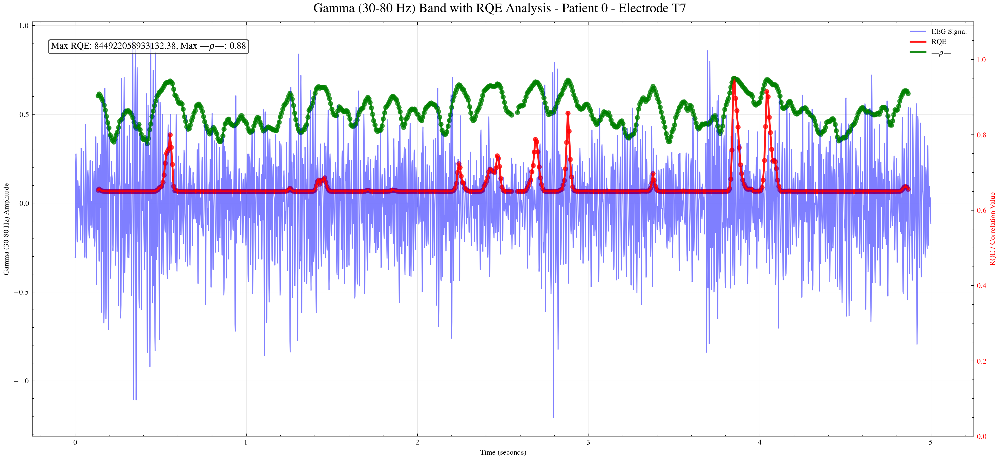

In [25]:
def plot_single_eeg_band_with_rqe(
    data: np.ndarray,
    patient_idx: int,
    channel_name: str,
    band_idx: int = 4,  # Default to Gamma band (4)
    start_time: int = 0,
    window_size: int = 5000,
    rqe_params: Dict = {
        "embedding_dim": 10,
        "radius": 0.8,
        "time_delay": 1,
        "raw_signal_window_size": 100,
        "rqa_space_window_size": 25,
        "min_diagonal_line": 5,
        "min_vertical_line": 1,
        "min_white_vertical_line": 1,
        "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
        "stride": 1
    },
    normalize_metrics: bool = False,
    debug: bool = True  # Add debug flag to print information
) -> Tuple[plt.Figure, plt.Axes]:
    """
    Visualize a single EEG frequency band with RQE analysis overlay for a specific patient and electrode.
    
    Parameters:
    -----------
    data : np.ndarray
        EEG data with shape (n_patients, n_electrodes, n_samples, n_bands)
    patient_idx : int
        Index of the patient to visualize
    channel_name : str
        Name of the electrode to visualize
    band_idx : int
        Index of the frequency band to visualize (0=Delta, 1=Theta, 2=Alpha, 3=Beta, 4=Gamma)
    start_time : int
        Starting time point for visualization
    window_size : int
        Number of samples to visualize
    rqe_params : Dict
        Parameters for RQE analysis
    normalize_metrics : bool
        Whether to normalize metrics before computing RQE
    debug : bool
        Whether to print debug information
    
    Returns:
    --------
    fig : plt.Figure
        The figure object
    ax : plt.Axes
        Axes object
    """
    
    # EEG bands names and channel names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    if band_idx < 0 or band_idx > 4:
        raise ValueError(f"Band index must be between 0 and 4. Got {band_idx}")
        
    band_name = bands[band_idx]
    
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    if debug:
        print(f"Processing data for patient {patient_idx}, electrode {channel_name} ({electrode_idx})")
        print(f"Analyzing frequency band: {band_name}")
        print(f"Data shape: {data.shape}")
        print(f"Time window: {start_time} to {start_time + window_size}")
        print(f"RQE parameters: {rqe_params}")
    
    # Create time vector (in seconds)
    time = np.arange(start_time, start_time + window_size) / 1000.0  # Convert to seconds
    
    # Extract data for the specific band
    band_signal = data[patient_idx, electrode_idx, start_time:start_time + window_size, band_idx]
    
    if debug:
        print(f"Band signal shape: {band_signal.shape}")
        print(f"Band signal min: {np.min(band_signal)}, max: {np.max(band_signal)}, mean: {np.mean(band_signal)}")
        print(f"Computing RQA time series...")
    
    # Create figure with just one subplot
    fig, ax = plt.subplots(figsize=(15, 7))
    fig.suptitle(f'{band_name} Band with RQE Analysis - Patient {patient_idx} - Electrode {channel_name}', 
                fontsize=14)
    
    # Original signal with alpha=0.5
    ax.plot(time, band_signal, 'b-', linewidth=1, alpha=0.5, label='EEG Signal')
    
    try:
        # Compute RQA time series
        rqa_matrix = compute_rqa_time_series(
            signal=band_signal,
            raw_signal_window_size=rqe_params["raw_signal_window_size"],
            embedding_dim=rqe_params["embedding_dim"],
            time_delay=rqe_params["time_delay"],
            radius=rqe_params["radius"],
            distance_metric="euclidean",
            min_diagonal_line=rqe_params["min_diagonal_line"],
            min_vertical_line=rqe_params["min_vertical_line"],
            min_white_vertical_line=rqe_params["min_white_vertical_line"],
            metrics_to_use=rqe_params["metrics_to_use"],
            stride=rqe_params["stride"]
        )
        
        if debug:
            print(f"RQA matrix shape: {rqa_matrix.shape}")
            print(f"RQA matrix contains NaN: {np.isnan(rqa_matrix).any()}")
            print(f"RQA matrix non-NaN values: {np.count_nonzero(~np.isnan(rqa_matrix))}")
            print(f"Number of windows: {rqa_matrix.shape[0]}")
        
        # If we should normalize the metrics
        if normalize_metrics:
            # Normalize each column (metric) independently
            for j in range(rqa_matrix.shape[1]):
                col = rqa_matrix[:, j]
                # Skip if all values are NaN
                if np.all(np.isnan(col)):
                    continue
                    
                # Extract non-NaN values
                valid_values = col[~np.isnan(col)]
                if len(valid_values) > 0:
                    col_min = np.min(valid_values)
                    col_max = np.max(valid_values)
                    
                    # Avoid division by zero
                    if col_max > col_min:
                        # Normalize non-NaN values
                        col[~np.isnan(col)] = (col[~np.isnan(col)] - col_min) / (col_max - col_min)
                        rqa_matrix[:, j] = col
        
        # Check if there are enough windows for RQE computation
        rqa_space_window_size = rqe_params["rqa_space_window_size"]
        if rqa_matrix.shape[0] <= rqa_space_window_size:
            if debug:
                print(f"WARNING: Not enough RQA windows ({rqa_matrix.shape[0]}) for RQA space window size ({rqa_space_window_size})")
                print(f"Need at least {rqa_space_window_size + 1} windows")
                
            # Create an info text but continue with the plot
            ax.text(0.5, 0.5, 
                    f"Not enough windows for RQE computation\nNeed {rqa_space_window_size + 1}, have {rqa_matrix.shape[0]}", 
                    transform=ax.transAxes, ha='center', va='center', 
                    bbox=dict(facecolor='red', alpha=0.2))
        else:
            if debug:
                print(f"Computing RQE and correlation...")
                
            # Compute RQE and correlation
            rqe_vals, corr_vals = compute_rqe_and_correlation(
                rqa_matrix, 
                rqa_space_window_size=rqa_space_window_size
            )
            
            if debug:
                print(f"RQE values shape: {rqe_vals.shape}")
                print(f"RQE values: {rqe_vals}")
                print(f"RQE min: {np.min(rqe_vals)}, max: {np.max(rqe_vals)}")
                print(f"Correlation values: {corr_vals}")

            # Create time vector for RQE values - adjust to match the centers of the windows
            raw_window_size = rqe_params["raw_signal_window_size"]
            stride = rqe_params["stride"]
            
            # Calculate window centers (in seconds)
            window_centers = []
            for i in range(rqa_matrix.shape[0]):
                # Calculate the middle point of each window in the original time domain
                window_start = i * stride
                window_center = window_start + raw_window_size / 2
                window_centers.append((start_time + window_center) / 1000.0)  # Convert to seconds
            
            # Calculate time points for RQE/correlation values
            rqe_time_points = []
            for i in range(len(rqe_vals)):
                # Each RQE value is computed from a window of RQA metrics
                # So the time corresponds to the middle of that window
                center_idx = i + rqa_space_window_size // 2
                if center_idx < len(window_centers):
                    rqe_time_points.append(window_centers[center_idx])
                else:
                    # Handle edge case
                    rqe_time_points.append(window_centers[-1])
            
            # Scale the values for better visibility
            if len(rqe_vals) > 0 and not np.all(np.isnan(rqe_vals)):
                # Extract signal amplitude range for scaling
                signal_range = np.max(band_signal) - np.min(band_signal)
                signal_min = np.min(band_signal)
                
                # Scale RQE and correlation to fit in the middle half of the signal range
                max_rqe = np.nanmax(rqe_vals) if np.nanmax(rqe_vals) > 0 else 1
                max_corr = np.nanmax(corr_vals) if np.nanmax(corr_vals) > 0 else 1
                
                # Create scaled versions that overlay nicely on the signal
                rqe_scaled = signal_min + signal_range * 0.6 + (rqe_vals / max_rqe) * (signal_range * 0.3)
                corr_scaled = signal_min + signal_range * 0.6 + (corr_vals / max_corr) * (signal_range * 0.3)
                
                # Plot RQE and correlation
                ax.plot(rqe_time_points, rqe_scaled, 'r-', 
                        linewidth=2, alpha=0.9, label='RQE')
                ax.plot(rqe_time_points, corr_scaled, 'g-', 
                        linewidth=2, alpha=0.9, label=r'|$\rho$|')
                
                # Add small markers to make the points more visible
                ax.scatter(rqe_time_points, rqe_scaled, color='r', s=20, alpha=0.7)
                ax.scatter(rqe_time_points, corr_scaled, color='g', s=20, alpha=0.7)
                
                # Add a small note about the scale
                ax.text(0.02, 0.95, rf"Max RQE: {max_rqe:.2f}, Max |$\rho$|: {max_corr:.2f}", 
                         transform=ax.transAxes, fontsize=10, 
                         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
                
                # Add a secondary y-axis for the RQE and correlation values
                ax2 = ax.twinx()
                ax2.set_ylabel('RQE / Correlation Value', color='r')
                ax2.tick_params(axis='y', labelcolor='r')
                ax2.set_ylim(0, 1.1)  # Normalized metrics are between 0 and 1
                
                # The limits need to be manually aligned with the primary axis
                primary_ylim = ax.get_ylim()
                y_min_primary = primary_ylim[0]
                y_max_primary = primary_ylim[1]
                
                # Map the [0, 1] range of normalized metrics to the signal display range
                ax2.set_ylim(
                    0,  # 0 maps to signal_min + 0.6*range
                    1.1  # 1 maps to signal_min + 0.9*range
                )
                
                # Add grid
                ax.grid(True, alpha=0.3)
                
            else:
                if debug:
                    print(f"WARNING: No valid RQE values to plot")
                    
    except Exception as e:
        if debug:
            print(f"ERROR computing RQE: {str(e)}")
            import traceback
            traceback.print_exc()
        
        # Add error message to the plot
        ax.text(0.5, 0.5, f"Error computing RQE:\n{str(e)}", 
                transform=ax.transAxes, ha='center', va='center', 
                bbox=dict(facecolor='red', alpha=0.2))
    
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel(f'{band_name} Amplitude')
    ax.legend(loc='upper right')
    
    # Styling
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    
    return fig, ax

# Example usage with band selection:
band_names = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
band_idx = 4  # Gamma band (4=Gamma, 3=Beta, 2=Alpha, 1=Theta, 0=Delta)

rqe_params = {
    "embedding_dim": 10,
    "radius": 0.8,
    "time_delay": 1,
    "raw_signal_window_size": 100,
    "rqa_space_window_size": 25,
    "min_diagonal_line": 5,
    "min_vertical_line": 1,
    "min_white_vertical_line": 1,
    "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
    "stride": 7  # Using a larger stride for faster computation
}

# For control group
fig_ct, ax_ct = plot_single_eeg_band_with_rqe(
    data_ct, 
    patient_idx=0, 
    channel_name="T7",
    band_idx=band_idx,  # Select which band to analyze
    start_time=0,
    window_size=5000,
    rqe_params=rqe_params,
    normalize_metrics=True,  # Enable normalization
    debug=False  # Enable debug output
)

plt.savefig(f"./rqe/results/single_band_{band_names[band_idx]}_patient0_T7.svg", format="svg", bbox_inches="tight", dpi=300)
plt.show()

/home/mariopasc/Python/Projects/Dyslexia_EEG_characterization/src/pyddeeg/signal_processing/rqa_toolbox/rqe.py:204: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, _ = stats.spearmanr(sub_block_T[l1, :], sub_block_T[l2, :])


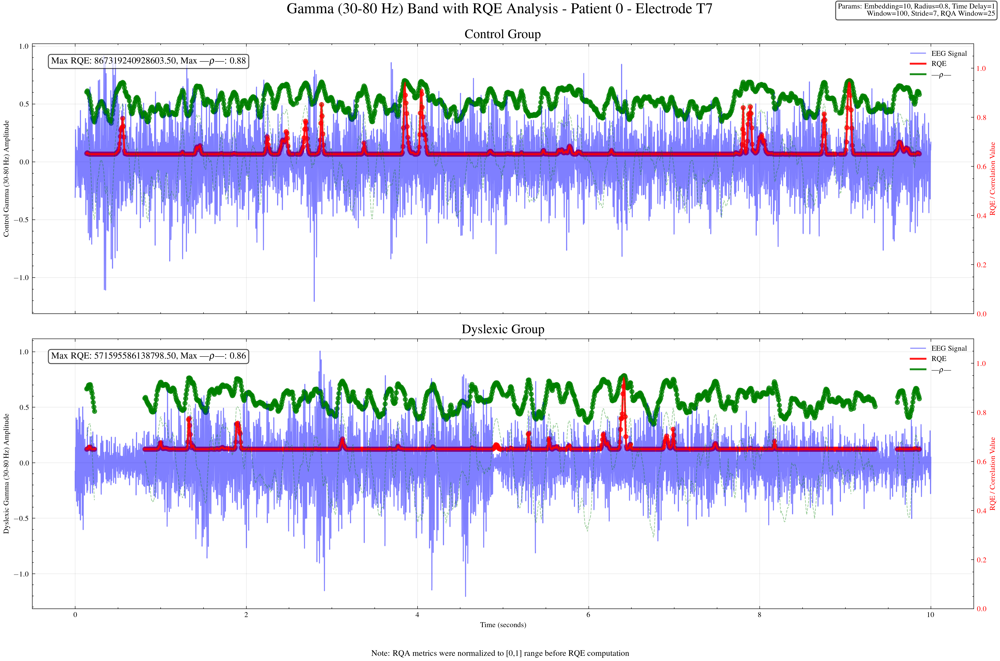

In [29]:
def plot_compare_eeg_band_with_rqe(
    data_ct: np.ndarray,
    data_dd: np.ndarray,
    patient_idx: int,
    channel_name: str,
    band_idx: int = 4,  # Default to Gamma band (4)
    start_time: int = 0,
    window_size: int = 5000,
    rqe_params: Dict = {
        "embedding_dim": 10,
        "radius": 0.8,
        "time_delay": 1,
        "raw_signal_window_size": 100,
        "rqa_space_window_size": 25,
        "min_diagonal_line": 5,
        "min_vertical_line": 1,
        "min_white_vertical_line": 1,
        "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
        "stride": 1
    },
    normalize_metrics: bool = False,
    debug: bool = True
) -> Tuple[plt.Figure, List[plt.Axes]]:
    """
    Compare EEG band with RQE analysis between control and dyslexic groups.
    
    Parameters:
    -----------
    data_ct : np.ndarray
        Control group EEG data
    data_dd : np.ndarray
        Dyslexic group EEG data
    patient_idx, channel_name, etc. : Various parameters
        Same as in plot_single_eeg_band_with_rqe
        
    Returns:
    --------
    fig : plt.Figure
        The figure object
    axes : List[plt.Axes]
        List of axes objects [ax_ct, ax_dd]
    """
    # EEG bands names and channel names
    bands = ['Delta (0.5-4 Hz)', 'Theta (4-8 Hz)', 'Alpha (8-12 Hz)', 
            'Beta (12-30 Hz)', 'Gamma (30-80 Hz)']
    
    if band_idx < 0 or band_idx > 4:
        raise ValueError(f"Band index must be between 0 and 4. Got {band_idx}")
        
    band_name = bands[band_idx]
    
    ch_names = ["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "FC5", "FC1", 
                "FC2", "FC6", "T7", "C3", "C4", "T8", "TP9", "CP5", "CP1",
                "CP2", "CP6", "TP10", "P7", "P3", "Pz", "P4", "P8", "PO9",
                "O1", "Oz", "O2", "PO10", "Cz"]
    
    # Find electrode index
    try:
        electrode_idx = ch_names.index(channel_name)
    except ValueError:
        raise ValueError(f"Channel {channel_name} not found. Available channels: {', '.join(ch_names)}")
    
    if debug:
        print(f"Processing data for patient {patient_idx}, electrode {channel_name} ({electrode_idx})")
        print(f"Analyzing frequency band: {band_name}")
    
    # Create time vector (in seconds)
    time = np.arange(start_time, start_time + window_size) / 1000.0  # Convert to seconds
    
    # Extract data for the specific band
    band_signal_ct = data_ct[patient_idx, electrode_idx, start_time:start_time + window_size, band_idx]
    band_signal_dd = data_dd[patient_idx, electrode_idx, start_time:start_time + window_size, band_idx]
    
    # Create figure with two subplots, one for each group
    fig, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
    fig.suptitle(f'{band_name} Band with RQE Analysis - Patient {patient_idx} - Electrode {channel_name}', 
                 fontsize=16)
    
    # Process and plot each group
    for idx, (label, ax, band_signal, data_source) in enumerate([
        ("Control", axes[0], band_signal_ct, "CT"),
        ("Dyslexic", axes[1], band_signal_dd, "DD")
    ]):
        # Plot original signal 
        ax.plot(time, band_signal, 'b-', linewidth=1, alpha=0.5, label='EEG Signal')
        ax.set_title(f"{label} Group", fontsize=14)
        
        # Create secondary y-axis for RQE values
        ax2 = ax.twinx()
        ax2.set_ylabel('RQE / Correlation Value', color='r')
        ax2.tick_params(axis='y', labelcolor='r')
        ax2.set_ylim(0, 1.1)
        
        try:
            # Compute RQA time series
            rqa_matrix = compute_rqa_time_series(
                signal=band_signal,
                raw_signal_window_size=rqe_params["raw_signal_window_size"],
                embedding_dim=rqe_params["embedding_dim"],
                time_delay=rqe_params["time_delay"],
                radius=rqe_params["radius"],
                distance_metric="euclidean",
                min_diagonal_line=rqe_params["min_diagonal_line"],
                min_vertical_line=rqe_params["min_vertical_line"],
                min_white_vertical_line=rqe_params["min_white_vertical_line"],
                metrics_to_use=rqe_params["metrics_to_use"],
                stride=rqe_params["stride"]
            )
            
            if debug:
                print(f"{label} Group - RQA matrix shape: {rqa_matrix.shape}")
            
            # Optional normalization
            if normalize_metrics:
                for j in range(rqa_matrix.shape[1]):
                    col = rqa_matrix[:, j]
                    if np.all(np.isnan(col)):
                        continue
                    valid_values = col[~np.isnan(col)]
                    if len(valid_values) > 0:
                        col_min = np.min(valid_values)
                        col_max = np.max(valid_values)
                        if col_max > col_min:
                            col[~np.isnan(col)] = (col[~np.isnan(col)] - col_min) / (col_max - col_min)
                            rqa_matrix[:, j] = col
            
            # Check if there are enough windows for RQE computation
            rqa_space_window_size = rqe_params["rqa_space_window_size"]
            if rqa_matrix.shape[0] <= rqa_space_window_size:
                if debug:
                    print(f"{label} Group - WARNING: Not enough RQA windows ({rqa_matrix.shape[0]}) for RQA space window size ({rqa_space_window_size})")
                
                ax.text(0.5, 0.5, 
                        f"Not enough windows for RQE computation\nNeed {rqa_space_window_size + 1}, have {rqa_matrix.shape[0]}", 
                        transform=ax.transAxes, ha='center', va='center', 
                        bbox=dict(facecolor='red', alpha=0.2))
            else:
                # Compute RQE and correlation
                rqe_vals, corr_vals = compute_rqe_and_correlation(
                    rqa_matrix, 
                    rqa_space_window_size=rqa_space_window_size
                )
                
                if debug:
                    print(f"{label} Group - RQE values shape: {rqe_vals.shape}")
                    print(f"{label} Group - RQE min: {np.min(rqe_vals)}, max: {np.max(rqe_vals)}")

                # Calculate time points for RQE values
                raw_window_size = rqe_params["raw_signal_window_size"]
                stride = rqe_params["stride"]
                
                # Calculate window centers
                window_centers = [(start_time + i * stride + raw_window_size / 2) / 1000.0 
                                 for i in range(rqa_matrix.shape[0])]
                
                # Calculate time points for RQE values
                rqe_time_points = []
                for i in range(len(rqe_vals)):
                    center_idx = i + rqa_space_window_size // 2
                    if center_idx < len(window_centers):
                        rqe_time_points.append(window_centers[center_idx])
                    else:
                        rqe_time_points.append(window_centers[-1])
                
                # Scale the values for better visibility on the main axis
                if len(rqe_vals) > 0 and not np.all(np.isnan(rqe_vals)):
                    signal_range = np.max(band_signal) - np.min(band_signal)
                    signal_min = np.min(band_signal)
                    
                    max_rqe = np.nanmax(rqe_vals) if np.nanmax(rqe_vals) > 0 else 1
                    max_corr = np.nanmax(corr_vals) if np.nanmax(corr_vals) > 0 else 1
                    
                    # Create scaled versions for primary axis
                    rqe_scaled = signal_min + signal_range * 0.6 + (rqe_vals / max_rqe) * (signal_range * 0.3)
                    corr_scaled = signal_min + signal_range * 0.6 + (corr_vals / max_corr) * (signal_range * 0.3)
                    
                    # Plot on main axis
                    ax.plot(rqe_time_points, rqe_scaled, 'r-', 
                            linewidth=2, alpha=0.9, label='RQE')
                    ax.plot(rqe_time_points, corr_scaled, 'g-', 
                            linewidth=2, alpha=0.9, label=r'|$\rho$|')
                    
                    # Add scatter points
                    ax.scatter(rqe_time_points, rqe_scaled, color='r', s=20, alpha=0.7)
                    ax.scatter(rqe_time_points, corr_scaled, color='g', s=20, alpha=0.7)
                    
                    # Also plot on secondary axis with original values
                    ax2.plot(rqe_time_points, rqe_vals, 'r--', alpha=0.4, linewidth=0.75)
                    ax2.plot(rqe_time_points, corr_vals, 'g--', alpha=0.4, linewidth=0.75)
                    
                    # Add note about max values
                    ax.text(0.02, 0.95, rf"Max RQE: {max_rqe:.2f}, Max |$\rho$|: {max_corr:.2f}", 
                            transform=ax.transAxes, fontsize=10, 
                            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
                else:
                    if debug:
                        print(f"{label} Group - WARNING: No valid RQE values to plot")
                
        except Exception as e:
            if debug:
                print(f"{label} Group - ERROR computing RQE: {str(e)}")
                import traceback
                traceback.print_exc()
            
            ax.text(0.5, 0.5, f"Error computing RQE:\n{str(e)}", 
                    transform=ax.transAxes, ha='center', va='center', 
                    bbox=dict(facecolor='red', alpha=0.2))
        
        # Styling and labels
        ax.set_ylabel(f'{label} {band_name} Amplitude')
        ax.legend(loc='upper right')
        ax.grid(True, alpha=0.3)
        ax.spines['top'].set_visible(False)
    
    # Only add x-label to bottom subplot
    axes[1].set_xlabel('Time (seconds)')
    
    # Add annotations about parameters in the upper right corner
    param_text = (
        f"Params: Embedding={rqe_params['embedding_dim']}, "
        f"Radius={rqe_params['radius']}, Time Delay={rqe_params['time_delay']}\n"
        f"Window={rqe_params['raw_signal_window_size']}, "
        f"Stride={rqe_params['stride']}, RQA Window={rqe_params['rqa_space_window_size']}"
    )
    fig.text(0.99, 0.98, param_text, fontsize=8, ha='right', va='top',
             bbox=dict(facecolor='white', alpha=0.7, boxstyle='round'))
    
    # Add note about normalization if used
    if normalize_metrics:
        fig.text(0.5, 0.01, "Note: RQA metrics were normalized to [0,1] range before RQE computation", 
                ha='center', fontsize=9, style='italic')
    
    plt.tight_layout()
    fig.subplots_adjust(top=0.92, bottom=0.08)  # Make room for suptitle and note
    
    return fig, axes

# Example usage:
band_names = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
band_idx = 4  # Gamma band (4=Gamma, 3=Beta, 2=Alpha, 1=Theta, 0=Delta)

rqe_params = {
    "embedding_dim": 10,
    "radius": 0.8,
    "time_delay": 1,
    "raw_signal_window_size": 100,
    "rqa_space_window_size": 25,
    "min_diagonal_line": 5,
    "min_vertical_line": 1,
    "min_white_vertical_line": 1,
    "metrics_to_use": ["RR", "DET", "ENT", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "PERM_ENT"],
    "stride": 7  # Using a larger stride for faster computation
}

fig, axes = plot_compare_eeg_band_with_rqe(
    data_ct=data_ct,
    data_dd=data_dd,
    patient_idx=0,
    channel_name="T7",
    band_idx=band_idx,
    start_time=0,
    window_size=10000,
    rqe_params=rqe_params,
    normalize_metrics=True,
    debug=False
)

plt.savefig(f"./rqe/results/compare_{band_names[band_idx]}_patient0_T7.svg", format="svg", bbox_inches="tight", dpi=300)
plt.show()